## Project 4 - The dynamical systems theory in the study of the dynamics of cosmological models of dark energy


### Kedar Mal (2022PHZ8451)
### Mohit Kumar (2022PHZ8449)

## Λ-CDM MODEL_ASODE(1)


In [6]:
using Plots, Dierckx

# An autonomous system of ordinary differential equations (ASODE(1))
function lcdm_odes1(x,y)
    # Given equations
    x′ = -x*(1-x+3*y)
    y′ = (3+x-3*y)*y
    return [x′,y′]
end

function trajectory(x₀,y₀)
    dt=0.0001
    T=0:dt:10
    N=length(T)
    X=zeros(N)
    Y=zeros(N)
        
    # initial values
    X[1]=x₀
    Y[1]=y₀

    for i=1:N-1
        X[i+1],Y[i+1]=[X[i],Y[i]] .+ dt.*lcdm_odes1(X[i],Y[i])
    end
    return X,Y
end

function arrowedcurve(xt,yt,N::Int)
    Nt = length(xt)
    tn = LinRange(1,Nt,N+2)[2:end-1]
    xt, yt = reshape(xt,1,:), reshape(yt,1,:)  # because Dierckx is picky
    spl = ParametricSpline(1:Nt,[xt;yt], k=5)  # use linear if plot code uses linear segments
    zn, dzn = evaluate(spl,tn)', derivative(spl, tn, nu=1)'
    cf = maximum([diff([extrema(xt)...]), diff([extrema(yt)...])])[1]/100
    dzn = cf * dzn ./ sqrt.(sum(abs2,dzn,dims=2))
    return zn, dzn
end

# Range of X and Y
X=0:0.05:1
Y=0:0.05:1

N=length(X)*length(Y)
x_pts=zeros(N)
y_pts=zeros(N)

# unit vector matrices
U=zeros(N)
V=zeros(N)

i=1
for x in X
    for y in Y
        if (x,y) in [(0,0),(0,1),(1,0),(1,1)]
            continue
        end

        u,v = lcdm_odes1(x,y)
        x_pts[i] = x
        y_pts[i] = y
            
        # unit vectors
        U[i] = u/sqrt(u^2+v^2) 
        V[i] = v/sqrt(u^2+v^2)
        i = i+1
    end
end

p = plot(framestyle=:box,xlims=(-0.1,1.1),ylims=(-0.1,1.1),title="Phase portrait of the ASODE(1) corresponding to the Λ-CDM model",titlefont=10,xlabel="x(t)",ylabel="y(t)")
q=quiver!(x_pts,y_pts,quiver=(U.*0.05,V.*0.05),linecolor=:red,arrow=:closed)
scatter!(q,[1],[0],label="Pr:(1,0)",markersize=6,markercolor=:blue)
scatter!(q,[0],[1],label="PdS:(0,1)",markersize=6,markercolor=:cyan)
scatter!(q,[0],[0],label="Pm:(0,0)",markersize=6,markercolor=:magenta)

#Trajectories
Xtraj0 = 0.999
Ytraj0 = [1E-3,1E-10,5E-12,1E-13,1E-15,1E-16,1E-17,1E-20]
lc = [:black,:green,:red,:blue,:black,:red,:green,:black]
#z = plot(framestyle=:box,xlims=(-0.1,1.1),ylims=(-0.1,1.1))
for i in 1:length(Ytraj0)
    Xtraj,Ytraj=trajectory(Xtraj0,Ytraj0[i])
    plot!(Xtraj,Ytraj,linewidth=2,label="",lc=lc[i],lw=2)
    zn, dzn = arrowedcurve(Xtraj,Ytraj,8)
    quiver!(zn[:,1],zn[:,2], quiver=(dzn[:,1],dzn[:,2]),arrow=arrow(:closed),lc=lc[i])
end
display(p)


## Λ-CDM MODEL_ASODE(2)


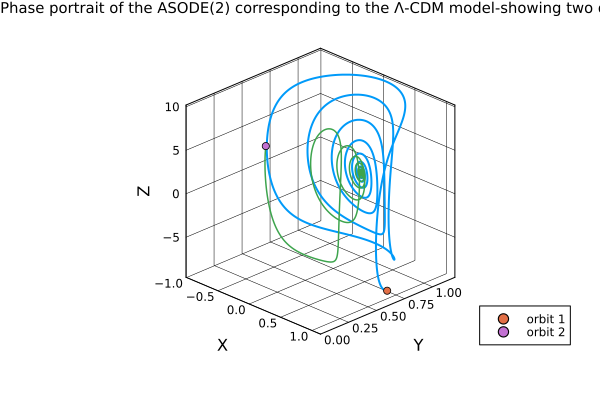

In [7]:
using Plots

# An autonomous system of ordinary differential equations (ASODE(2))
function lcdm_odes2(x,y,z,dt)
    μ = 10.0
    x′=-1.5 * x* (1-x^2+y^2)-sqrt(1.5)*y^2*z
    y′= 1.5*y*(1+x^2-y^2)+sqrt(1.5)*x*y*z
    z′=sqrt(6)*x*(μ^2-z^2)
    return [x + x′ * dt, y + y′ * dt, z + z′ * dt]
end

function trajectory(x₀,y₀,z₀)
    dt=0.0001
    T=0:dt:5

    N=length(T)

    X=zeros(N)
    Y=zeros(N)
    Z=zeros(N)


    X[1]=x₀
    Y[1]=y₀
    Z[1]=z₀
    for i=1:N-1
        X[i+1],Y[i+1],Z[i+1]=lcdm_odes2(X[i],Y[i],Z[i],dt)
    end
    return X,Y,Z
end

plot(title="Phase portrait of the ASODE(2) corresponding to the Λ-CDM model-showing two orbits",titlefont=10,axiscolor = invisible(),framestyle=:box)
X1,Y1,Z1=trajectory(0.95,0.7,-9)
p=plot!(X1,Y1,Z1,gridalpha=1,label="",xlabel="X",ylabel="Y",zlabel="Z",camera=(45,25),ylim=(0,1.2),w=2)
scatter!(p,[X1[1]],[Y1[1]],[Z1[1]],label="orbit 1")

X2,Y2,Z2=trajectory(-0.45,0.4,5)
plot!(p,X2,Y2,Z2,label="",linewidth=1.5)
scatter!(p,[X2[1]],[Y2[1]],[Z2[1]],label="orbit 2")

display(p)

